In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load the datasets
who_df = pd.read_csv('/content/WHO-COVID-19-global-data.csv')
expenditure_df = pd.read_excel('/content/COVID_expenditure.xlsx')
population_df = pd.read_csv('/content/Population, female (% of total population).csv')
gdp_df = pd.read_excel('/content/GDP.xlsx')
area_df = pd.read_csv('/content/area.csv')
gender_df = pd.read_csv('/content/pop.csv')

In [3]:
# Standardize country names across datasets
who_df.rename(columns={'Country': 'Country'}, inplace=True)
expenditure_df.rename(columns={'Countries': 'Country'}, inplace=True)
population_df.rename(columns={'name': 'Country'}, inplace=True)
gdp_df.rename(columns={'Country': 'Country'}, inplace=True)
area_df.rename(columns={'name': 'Country'}, inplace=True)
gender_df.rename(columns={'Economy': 'Country'}, inplace=True)

In [4]:
# Check columns in each DataFrame to confirm column names
print("WHO Global Columns:", who_df.columns)
print("Expenditure Columns:", expenditure_df.columns)
print("Population Columns:", population_df.columns)
print("GDP Columns:", gdp_df.columns)
print("Area Columns:", area_df.columns)
print("Gender Columns:", gender_df.columns)

WHO Global Columns: Index(['Date_reported', 'Country_code', 'Country', 'WHO_region', 'New_cases',
       'Cumulative_cases', 'New_deaths', 'Cumulative_deaths'],
      dtype='object')
Expenditure Columns: Index(['Country', 'Indicators', 'Unnamed: 2', '2021'], dtype='object')
Population Columns: Index(['Economy', 'Year', 'Economy Code',
       'Population, female (% of total population)'],
      dtype='object')
GDP Columns: Index(['United States',  27360935000000,  25744108000000,  23594031000000,
        21322950000000,  21521395000000],
      dtype='object')
Area Columns: Index(['Country', 'slug', 'value', 'date_of_information', 'ranking', 'region'], dtype='object')
Gender Columns: Index(['name', 'slug', 'value', 'date_of_information', 'ranking', 'region'], dtype='object')


In [5]:
# Check columns in each DataFrame to confirm column names
who_df.rename(columns={'Country': 'Country'}, inplace=True)
expenditure_df.rename(columns={'Country': 'Country', '2021': 'Expenditure_Per_Capita_2021'}, inplace=True)
population_df.rename(columns={'Economy': 'Country', 'Population, female (% of total population)': 'Population_Female_Percent'}, inplace=True)
area_df.rename(columns={'name': 'Country', 'value': 'Area'}, inplace=True)
gender_df.rename(columns={'name': 'Country', 'value': 'Region_Size'}, inplace=True)

In [6]:
# Merge datasets sequentially on 'Country'
merged_df = who_df.merge(expenditure_df[['Country', 'Expenditure_Per_Capita_2021']], on='Country', how='left')
merged_df = merged_df.merge(population_df[['Country', 'Population_Female_Percent']], on='Country', how='left')
merged_df = merged_df.merge(area_df[['Country', 'Area']], on='Country', how='left')
merged_df = merged_df.merge(gender_df[['Country', 'Region_Size']], on='Country', how='left')

In [8]:
merged_df

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths,Expenditure_Per_Capita_2021,Population_Female_Percent,Area,Region_Size
0,2020-01-05,AF,Afghanistan,EMRO,NaN,0,NaN,0,2.324045,49.488,"37,466,414","652,230"
1,2020-01-12,AF,Afghanistan,EMRO,NaN,0,NaN,0,2.324045,49.488,"37,466,414","652,230"
2,2020-01-19,AF,Afghanistan,EMRO,NaN,0,NaN,0,2.324045,49.488,"37,466,414","652,230"
3,2020-01-26,AF,Afghanistan,EMRO,NaN,0,NaN,0,2.324045,49.488,"37,466,414","652,230"
4,2020-02-02,AF,Afghanistan,EMRO,NaN,0,NaN,0,2.324045,49.488,"37,466,414","652,230"
...,...,...,...,...,...,...,...,...,...,...,...,...
60235,2024-09-22,ZW,Zimbabwe,AFRO,NaN,266393,NaN,5740,NaN,52.833,"14,829,988","390,757"
60236,2024-09-29,ZW,Zimbabwe,AFRO,0.0,266393,0.0,5740,NaN,52.833,"14,829,988","390,757"
60237,2024-10-06,ZW,Zimbabwe,AFRO,3.0,266396,0.0,5740,NaN,52.833,"14,829,988","390,757"
60238,2024-10-13,ZW,Zimbabwe,AFRO,NaN,266396,NaN,5740,NaN,52.833,"14,829,988","390,757"


In [9]:
merged_df.isnull().sum()

,0
Date_reported,0
Country_code,251
Country,0
WHO_region,4518
New_cases,15213
Cumulative_cases,0
New_deaths,15075
Cumulative_deaths,0
Expenditure_Per_Capita_2021,47941
Population_Female_Percent,14307


In [10]:
merged_df = merged_df.dropna(subset=['Country_code'])

In [11]:
merged_df['WHO_region'] = merged_df['WHO_region'].fillna(merged_df['WHO_region'].mode()[0])

In [12]:
merged_df['New_cases'] = merged_df['New_cases'].fillna(0)
merged_df['New_deaths'] = merged_df['New_deaths'].fillna(0)

In [13]:
merged_df['Expenditure_Per_Capita_2021'] = merged_df['Expenditure_Per_Capita_2021'].fillna(0)

In [14]:
merged_df['Population_Female_Percent'] = merged_df['Population_Female_Percent'].fillna(merged_df['Population_Female_Percent'].median())

In [15]:
# Remove commas from the columns and convert to numeric
merged_df['Area'] = merged_df['Area'].replace({',': ''}, regex=True).astype(float)
merged_df['Region_Size'] = merged_df['Region_Size'].replace({',': ''}, regex=True).astype(float)

In [16]:
# Now fill missing values with median
merged_df['Area'] = merged_df['Area'].fillna(merged_df['Area'].median())
merged_df['Region_Size'] = merged_df['Region_Size'].fillna(merged_df['Region_Size'].median())

In [17]:
print(merged_df.isnull().sum())

Date_reported                  0
Country_code                   0
Country                        0
WHO_region                     0
New_cases                      0
Cumulative_cases               0
New_deaths                     0
Cumulative_deaths              0
Expenditure_Per_Capita_2021    0
Population_Female_Percent      0
Area                           0
Region_Size                    0
dtype: int64


In [18]:
merged_df.columns

Index(['Date_reported', 'Country_code', 'Country', 'WHO_region', 'New_cases',
       'Cumulative_cases', 'New_deaths', 'Cumulative_deaths',
       'Expenditure_Per_Capita_2021', 'Population_Female_Percent', 'Area',
       'Region_Size'],
      dtype='object')

In [19]:
# Get the top 10 countries with the highest Cumulative_deaths
top_countries = merged_df.groupby("Country")["Cumulative_deaths"].max().nlargest(10).index

In [20]:
# Filter the merged_df to include only these top countries
merged_df_top = merged_df[merged_df["Country"].isin(top_countries)]

In [21]:
# Create the line chart for New_cases over time for the top 10 countries
fig = px.line(merged_df_top, x="Date_reported", y="New_cases", color="Country",
              title="New Cases Over Time for Top 10 Countries with Highest Cumulative Deaths",
              labels={"New_cases": "New Cases", "Date_reported": "Date"})

# Update the layout to add a dropdown with multi-select
fig.update_layout(
    updatemenus=[{
        "buttons": [
            # Add button for showing all countries
            {"method": "restyle", "args": [{"visible": [True] * len(top_countries)}, "line"], "label": "Show All Countries"},

            # Add button to show only selected countries
            {
                "method": "relayout",
                "args": ["{visible}", {"title": "New Cases Over Time"}],
                "label": "Select Countries"
            }
        ],
        "direction": "down",
        "showactive": True,
        "active": 0,
        "x": 1.05,
        "xanchor": "left",
        "y": 1,
        "yanchor": "top"
    }]
)

# Show the figure
fig.show()

In [22]:
# Get the top 10 countries with the highest Cumulative_deaths
top_countries = merged_df.groupby("Country")["Cumulative_deaths"].max().nlargest(10).index

# Filter the merged_df to include only these top countries
merged_df_top = merged_df[merged_df["Country"].isin(top_countries)]

# Create the line chart for New_deaths over time for the top 10 countries
fig = px.line(merged_df_top, x="Date_reported", y="New_deaths", color="Country",
              title="New Deaths Over Time for Top 10 Countries with Highest Cumulative Deaths",
              labels={"New_deaths": "New Deaths", "Date_reported": "Date"})

# Update the layout to add a dropdown with multi-select for countries
fig.update_layout(
    updatemenus=[{
        "buttons": [
            # Button for showing all countries
            {"method": "restyle", "args": [{"visible": [True] * len(top_countries)}, "line"], "label": "Show All Countries"},

            # Button for selecting countries
            {
                "method": "relayout",
                "args": ["{visible}", {"title": "New Deaths Over Time"}],
                "label": "Select Countries"
            }
        ],
        "direction": "down",
        "showactive": True,
        "active": 0,
        "x": 1.05,  # Position the button to the right
        "xanchor": "left",
        "y": 1.1,  # Position it above the dropdown
        "yanchor": "top"
    }],

    # Adding a range slider for date selection on the x-axis
    xaxis=dict(
        rangeslider=dict(visible=True),
        type="date",
        rangeslider_thickness=0.1,
    )
)

# Show the figure
fig.show()

In [23]:
# Get the list of all countries in the dataset
all_countries = merged_df["Country"].unique()

# Filter the merged_df to include all countries in the dataset
merged_df_all = merged_df[merged_df["Country"].isin(all_countries)]

# Create the line chart for New_cases over time for all countries
fig = px.line(merged_df_all, x="Date_reported", y="New_cases", color="Country",
              title="New Cases Over Time for All Countries",
              labels={"New_cases": "New Cases", "Date_reported": "Date"})

# Add Multi-Select Dropdown for Countries
country_buttons = []
for country in all_countries:
    country_buttons.append(
        {
            "method": "restyle",
            "args": [{"visible": [c == country for c in all_countries]}, "line"],
            "label": country
        }
    )

# Add "Show All Countries" button
country_buttons.append(
    {
        "method": "restyle",
        "args": [{"visible": [True] * len(all_countries)}, "line"],
        "label": "Show All Countries"
    }
)

# Update Layout to add the Country Dropdown and Date Range Selection
fig.update_layout(
    updatemenus=[{
        "buttons": country_buttons,
        "direction": "down",
        "showactive": True,
        "active": 0,
        "x": 1.05,
        "xanchor": "left",
        "y": 1.1,
        "yanchor": "top"
    }],

    # Add a range slider for date selection on the x-axis
    xaxis=dict(
        rangeslider=dict(visible=True),
        type="date",
        rangeslider_thickness=0.1,
    )
)

# Show the figure
fig.show()

In [24]:
# Get the list of all countries in the dataset
all_countries = merged_df["Country"].unique()

# Filter the merged_df to include all countries in the dataset
merged_df_all = merged_df[merged_df["Country"].isin(all_countries)]

# Create the line chart for New_deaths over time for all countries
fig = px.line(merged_df_all, x="Date_reported", y="New_deaths", color="Country",
              title="New Deaths Over Time for All Countries",
              labels={"New_deaths": "New Deaths", "Date_reported": "Date"})

# Add Multi-Select Dropdown for Countries
country_buttons = []
for country in all_countries:
    country_buttons.append(
        {
            "method": "restyle",
            "args": [{"visible": [c == country for c in all_countries]}, "line"],
            "label": country
        }
    )

# Add "Show All Countries" button
country_buttons.append(
    {
        "method": "restyle",
        "args": [{"visible": [True] * len(all_countries)}, "line"],
        "label": "Show All Countries"
    }
)

# Update Layout to add the Country Dropdown and Date Range Selection
fig.update_layout(
    updatemenus=[{
        "buttons": country_buttons,
        "direction": "down",
        "showactive": True,
        "active": 0,
        "x": 1.05,
        "xanchor": "left",
        "y": 1.1,
        "yanchor": "top"
    }],

    # Add a range slider for date selection on the x-axis
    xaxis=dict(
        rangeslider=dict(visible=True),
        type="date",
        rangeslider_thickness=0.1,
    )
)

# Show the figure
fig.show()

In [25]:
# Aggregating data by WHO region
region_df = merged_df.groupby(['Date_reported', 'WHO_region'])[['New_cases']].sum().reset_index()

# Creating the line chart
fig = px.line(region_df, x="Date_reported", y="New_cases", color="WHO_region",
              title="COVID-19 New Cases Over Time by WHO Region",
              labels={"New_cases": "New Cases", "Date_reported": "Date"})

# Show the figure
fig.show()

In [26]:
# Aggregating data by WHO region for New Deaths
region_df_deaths = merged_df.groupby(['Date_reported', 'WHO_region'])[['New_deaths']].sum().reset_index()

# Creating the line chart for New Deaths
fig_deaths = px.line(region_df_deaths, x="Date_reported", y="New_deaths", color="WHO_region",
                     title="COVID-19 New Deaths Over Time by WHO Region",
                     labels={"New_deaths": "New Deaths", "Date_reported": "Date"})

# Show the figure
fig_deaths.show()

In [27]:
# Convert 'Date_reported' to datetime for time-based grouping
merged_df['Date_reported'] = pd.to_datetime(merged_df['Date_reported'])

# Aggregate by monthly trends to smooth out daily fluctuations
merged_df['Year_Month'] = merged_df['Date_reported'].dt.to_period('M')
merged_df['Year_Month'] = merged_df['Year_Month'].dt.to_timestamp()  # Convert to timestamp format for Plotly

# Aggregate data by region and month
regional_data_deaths = merged_df.groupby(['WHO_region', 'Year_Month']).agg({
    'New_deaths': 'sum'
}).reset_index()

# Pivot the data to create a matrix format for the heatmap
heatmap_data_deaths = regional_data_deaths.pivot(index='WHO_region', columns='Year_Month', values='New_deaths')

# Plot heatmap
import plotly.express as px

fig_deaths = px.imshow(
    heatmap_data_deaths,
    color_continuous_scale='Reds',
    title="Heatmap of COVID-19 Deaths by WHO Region and Month"
)

fig_deaths.update_xaxes(title_text="Month")
fig_deaths.update_yaxes(title_text="WHO Region")
fig_deaths.show()


In [29]:
# Group the data by 'Country' and aggregate the total cumulative deaths
bar_data = merged_df.groupby('Country').agg({'Cumulative_deaths': 'max'}).reset_index()

# Get the top N countries based on total cumulative deaths
top_bar_data = bar_data.nlargest(10, 'Cumulative_deaths')

fig = px.bar(
    top_bar_data,
    x='Country',
    y='Cumulative_deaths',
    title="Total COVID-19 Deaths for Top 10 Countries",
    labels={'Cumulative_deaths': 'Total Deaths'}
)

fig.show()

In [30]:
merged_df['Expenditure_Per_Capita_2021'] = pd.to_numeric(merged_df['Expenditure_Per_Capita_2021'], errors='coerce')
merged_df['Population_Female_Percent'] = pd.to_numeric(merged_df['Population_Female_Percent'], errors='coerce')
merged_df['Area'] = pd.to_numeric(merged_df['Area'], errors='coerce')
merged_df['Region_Size'] = pd.to_numeric(merged_df['Region_Size'], errors='coerce')

# Group the data by 'Country' and aggregate the total cumulative deaths
bar_data = merged_df.groupby('Country').agg({
    'Cumulative_deaths': 'max',
    'Expenditure_Per_Capita_2021': 'mean',
    'Population_Female_Percent': 'mean',
    'Area': 'mean',
    'Region_Size': 'mean'
}).reset_index()

# Get the top N countries based on total cumulative deaths
top_bar_data = bar_data.nlargest(20, 'Cumulative_deaths')

fig = px.bar(
    top_bar_data,
    x='Country',
    y='Cumulative_deaths',
    title="Total COVID-19 Deaths for Top 20 Countries",
    labels={'Cumulative_deaths': 'Total Deaths'},
    hover_data={
        'Cumulative_deaths': True,
        'Expenditure_Per_Capita_2021': True,
        'Population_Female_Percent': True,
        'Area': True,
        'Region_Size': True
    }
)

fig.show()


In [31]:
merged_df['Cumulative_deaths'] = pd.to_numeric(merged_df['Cumulative_deaths'], errors='coerce')

# Group the data by 'Country' and aggregate the total cumulative deaths
choropleth_data = merged_df.groupby('Country').agg({
    'Cumulative_deaths': 'max'
}).reset_index()

# Plot choropleth map
fig = px.choropleth(
    choropleth_data,
    locations='Country',
    locationmode='country names',
    color='Cumulative_deaths',
    color_continuous_scale="Viridis",
    title="Choropleth Map of COVID-19 Deaths by Country"
)

fig.show()

In [32]:
merged_df['Cumulative_deaths'] = pd.to_numeric(merged_df['Cumulative_deaths'], errors='coerce')
merged_df['Expenditure_Per_Capita_2021'] = pd.to_numeric(merged_df['Expenditure_Per_Capita_2021'], errors='coerce')
merged_df['Population_Female_Percent'] = pd.to_numeric(merged_df['Population_Female_Percent'], errors='coerce')
merged_df['Area'] = pd.to_numeric(merged_df['Area'], errors='coerce')
merged_df['Region_Size'] = pd.to_numeric(merged_df['Region_Size'], errors='coerce')

# Group the data by 'Country' and aggregate the total cumulative deaths
choropleth_data = merged_df.groupby('Country').agg({
    'Cumulative_deaths': 'max',
    'Expenditure_Per_Capita_2021': 'mean',
    'Population_Female_Percent': 'mean',
    'Area': 'mean',
    'Region_Size': 'mean'
}).reset_index()

# Plot choropleth map
fig = px.choropleth(
    choropleth_data,
    locations='Country',
    locationmode='country names',
    color='Cumulative_deaths',
    color_continuous_scale="Viridis",
    title="Choropleth Map of COVID-19 Deaths by Country",
    hover_data={
        'Cumulative_deaths': True,
        'Expenditure_Per_Capita_2021': True,
        'Population_Female_Percent': True,
        'Area': True,
        'Region_Size': True
    }
)

fig.show()

In [33]:
pip install folium

In [34]:
merged_df['Cumulative_deaths'] = pd.to_numeric(merged_df['Cumulative_deaths'], errors='coerce')

# Aggregate data by country
choropleth_data = merged_df.groupby('Country').agg({
    'Cumulative_deaths': 'max'
}).reset_index()

# Create the choropleth map w
fig = go.Figure(go.Choropleth(
    locations=choropleth_data['Country'],
    locationmode='country names',
    z=choropleth_data['Cumulative_deaths'],
    hoverinfo='location+z',
    colorscale='Viridis',
    colorbar_title='Cumulative Deaths',
))

# Update layout for the Earth-like shape
fig.update_geos(
    projection_type="orthographic",
    showcoastlines=True,
    coastlinecolor="Black",
    showland=True,
    landcolor="lightgray",
    showocean=True,
    oceancolor="lightblue"
)

fig.update_layout(
    title_text="Choropleth Map of COVID-19 Deaths by Country",
    geo=dict(showframe=False, showcoastlines=True, projection_type="orthographic"),
)

fig.show()


In [36]:
#Scatter Plot of New cases vs new deaths by country
fig = px.scatter(
    merged_df,
    x='New_cases',
    y='New_deaths',
    color='Country',
    size='Population_Female_Percent',
    hover_data=['Country', 'Cumulative_deaths', 'Expenditure_Per_Capita_2021', 'Area'],
    title="Scatter Plot of New Cases vs. New Deaths by Country"
)
fig.show()

In [37]:
# Scatter Plot of cumulative deaths vs population percentage (Female) by country
fig = px.scatter(
    merged_df,
    x='Population_Female_Percent',
    y='Cumulative_deaths',
    color='WHO_region',
    size='Area',
    color_discrete_sequence=px.colors.qualitative.Plotly,
    hover_data=['Country', 'Cumulative_cases', 'Expenditure_Per_Capita_2021', 'Region_Size'],
    title="Scatter Plot of Cumulative Deaths vs. Population Percentage (Female) by Country"
)

# Update marker properties for visibility
fig.update_traces(marker=dict(
    opacity=0.8,
    line=dict(width=1, color='DarkSlateGrey')
))


fig.update_layout(
    xaxis_title="Population Female Percent (%)",
    yaxis_title="Cumulative COVID-19 Deaths",
    legend_title="WHO Region",
    title_font=dict(size=20),
    legend=dict(title_font_size=14),
)

fig.show()

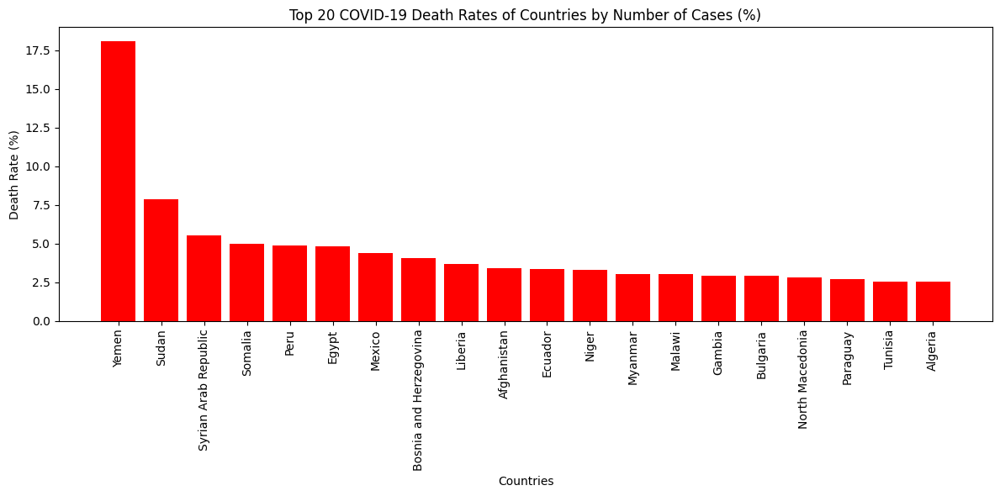

In [38]:
# Calculate the death rate for each country
merged_df['Death_rate'] = (merged_df['Cumulative_deaths'] / merged_df['Cumulative_cases']) * 100

# Aggregate data by country and take the last available value for death rate
country_deaths = merged_df.groupby('Country').agg({'Death_rate': 'last'}).reset_index()

# Sort countries by death rate in descending order
country_deaths = country_deaths.sort_values(by='Death_rate', ascending=False)

# Select the top 20 countries
top_n = 20
top_country_deaths = country_deaths.head(top_n)

# Create the bar plot
plt.figure(figsize=(12, 6))
plt.bar(top_country_deaths['Country'], top_country_deaths['Death_rate'], color="red")
plt.title(f'Top {top_n} COVID-19 Death Rates of Countries by Number of Cases (%)')
plt.xlabel('Countries')
plt.ylabel('Death Rate (%)')
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

In [39]:
# Calculate the death rate for each country
merged_df['Death_rate'] = (merged_df['Cumulative_deaths'] / merged_df['Cumulative_cases']) * 100

# Aggregate data by country and take the last available value for death rate
country_deaths = merged_df.groupby('Country').agg({'Death_rate': 'last'}).reset_index()

# Sort countries by death rate in descending order
country_deaths = country_deaths.sort_values(by='Death_rate', ascending=False)

# Select the top 20 countries
top_n = 20
top_country_deaths = country_deaths.head(top_n)

# Create the bar plot using Plotly
fig = px.bar(
    top_country_deaths,
    x='Country',
    y='Death_rate',
    title=f'Top {top_n} COVID-19 Death Rates by Country (%)',
    labels={'Death_rate': 'Death Rate (%)'},
    color='Death_rate',
    color_continuous_scale='Reds',
)

fig.update_xaxes(tickangle=90)

# Show the plot
fig.show()

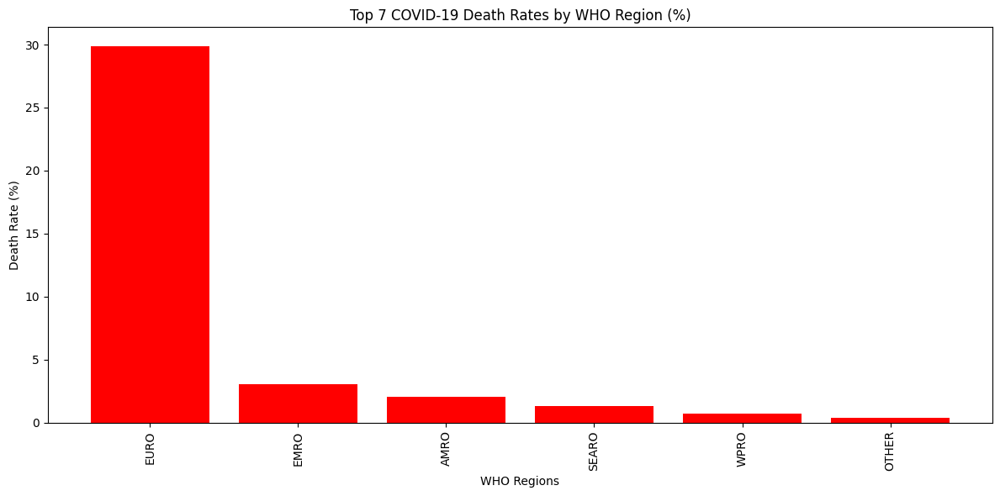

In [40]:
# Calculate the death rate for each entry in the dataset
merged_df['Death_rate'] = (merged_df['Cumulative_deaths'] / merged_df['Cumulative_cases']) * 100

# Aggregate data by region and calculate the mean death rate for each region
region_deaths = merged_df.groupby('WHO_region').agg({'Death_rate': 'mean'}).reset_index()

# Sort regions by death rate in descending order
region_deaths = region_deaths.sort_values(by='Death_rate', ascending=False)

top_n = 7
top_region_deaths = region_deaths.head(top_n)

# Create the bar plot
plt.figure(figsize=(12, 6))
plt.bar(top_region_deaths['WHO_region'], top_region_deaths['Death_rate'], color="red")
plt.title(f'Top {top_n} COVID-19 Death Rates by WHO Region (%)')
plt.xlabel('WHO Regions')
plt.ylabel('Death Rate (%)')
plt.xticks(rotation=90)
plt.tight_layout()

# Show the plot
plt.show()

In [41]:
# Calculate the death rate for each entry in the dataset
merged_df['Death_rate'] = (merged_df['Cumulative_deaths'] / merged_df['Cumulative_cases']) * 100

# Aggregate data by region and calculate the mean death rate for each region
region_rate = merged_df.groupby('WHO_region').agg({'Death_rate': 'mean'}).reset_index()

# Create the bar plot using Plotly
fig = go.Figure(go.Bar(
    x=region_rate['WHO_region'],
    y=region_rate['Death_rate'],
    marker=dict(color='red'),
))

# Update layout for better presentation
fig.update_layout(
    title="Deaths Rates of Regions by Number of Cases (%)",
    xaxis_title="Regions",
    yaxis_title="Death Rate (%)",
    xaxis_tickangle=-45,
    showlegend=False
)

# Show the figure
fig.show()

In [42]:
# Calculate the number of survivors by subtracting cumulative deaths from cumulative cases
merged_df['Survivors'] = merged_df['Cumulative_cases'] - merged_df['Cumulative_deaths']

In [43]:
# Group by Country and calculate total survivors
survivors_data = merged_df.groupby('Country').agg({'Survivors': 'max'}).reset_index()

# Sort countries based on survivors
top_survivors_data = survivors_data.nlargest(20, 'Survivors')

# Create the bar chart
fig = px.bar(
    top_survivors_data,
    x='Country',
    y='Survivors',
    title="Top 20 Countries with Most COVID-19 Survivors",
    labels={'Survivors': 'Number of Survivors'},
    color='Survivors',
    color_continuous_scale='Viridis'
)

# Show the figure
fig.show()

In [44]:
# Aggregate survivors by region
region_survivors = merged_df.groupby('WHO_region').agg({'Survivors': 'sum'}).reset_index()

# Create the bar chart for survivors by region
fig = px.bar(
    region_survivors,
    x='WHO_region',
    y='Survivors',
    title="Total COVID-19 Survivors by Region",
    labels={'Survivors': 'Number of Survivors'},
    color='Survivors',
    color_continuous_scale='Viridis'
)

fig.show()

In [47]:
!pip install dash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 15.7 MB/s eta 0:00:00
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3


In [48]:
import dash
from dash import dcc, html, Input, Output
import plotly.express as px
import pandas as pd

# Load data
df = pd.read_csv("/content/WHO-COVID-19-global-data.csv")

# Convert 'Date_reported' to datetime and add 'Year_Month'
df['Date_reported'] = pd.to_datetime(df['Date_reported'])
df['Year_Month'] = df['Date_reported'].dt.to_period('M').astype(str)

# Calculate the rate of change in cases and deaths
df['New_cases_change'] = df.groupby('Country')['New_cases'].diff()
df['New_deaths_change'] = df.groupby('Country')['New_deaths'].diff()

# Calculate CFR (Case Fatality Rate)
df['CFR'] = (df['New_deaths'] / df['New_cases']) * 100

# Initialize the Dash app
app = dash.Dash(__name__)

# Define layout with custom styling
app.layout = html.Div(
    style={'backgroundColor': '#f9f9f9', 'padding': '20px'},
    children=[
        html.H1("COVID-19 Dashboard", style={'textAlign': 'center', 'color': '#333'}),

        # Country selection dropdown with multiple selection
        html.Div([
            html.Label("Select Country(s)", style={'fontSize': '18px'}),
            dcc.Dropdown(
                id='country-dropdown',
                options=[{'label': country, 'value': country} for country in df['Country'].unique()],
                value=['United States of America'],
                multi=True,
                style={'width': '80%', 'margin': 'auto'},
                placeholder="Select one or more countries",
            )
        ], style={'marginBottom': '20px', 'textAlign': 'center'}),

        # Date range picker with predefined options
        html.Div([
            html.Label("Select Date Range", style={'fontSize': '18px'}),
            dcc.DatePickerRange(
                id='date-picker-range',
                start_date=df['Date_reported'].min(),
                end_date=df['Date_reported'].max(),
                display_format='YYYY-MM-DD',
                style={'width': '80%', 'margin': 'auto'}
            ),
            dcc.Dropdown(
                id="date-range-predefined",
                options=[
                    {'label': 'Last 7 Days', 'value': '7'},
                    {'label': 'Last 30 Days', 'value': '30'},
                    {'label': 'All Time', 'value': 'all'},
                ],
                value='all',
                style={'width': '80%', 'margin': 'auto', 'marginTop': '10px'},
                placeholder="Select date range"
            ),
        ], style={'marginBottom': '20px', 'textAlign': 'center'}),

        # Interactive Chart Options
        html.Div([
            # Line chart for New Cases & Deaths Trend
            html.Div([dcc.Graph(id='line-chart')], style={'border': '1px solid #ddd', 'borderRadius': '10px', 'padding': '15px', 'backgroundColor': 'white', 'width': '48%', 'marginRight': '4%'}),
            # Heatmap
            html.Div([dcc.Graph(id='heatmap')], style={'border': '1px solid #ddd', 'borderRadius': '10px', 'padding': '15px', 'backgroundColor': 'white', 'width': '48%'}),
        ], style={'display': 'flex', 'justifyContent': 'space-between', 'flexWrap': 'wrap', 'marginBottom': '20px'}),

        html.Div([
            # Bar chart for Cumulative Deaths by Country
            html.Div([dcc.Graph(id='bar-chart')], style={'border': '1px solid #ddd', 'borderRadius': '10px', 'padding': '15px', 'backgroundColor': 'white', 'width': '48%', 'marginRight': '4%'}),
            # Rate of Change chart (Peak and Low points)
            html.Div([dcc.Graph(id='rate-of-change')], style={'border': '1px solid #ddd', 'borderRadius': '10px', 'padding': '15px', 'backgroundColor': 'white', 'width': '48%'}),
        ], style={'display': 'flex', 'justifyContent': 'space-between', 'flexWrap': 'wrap'}),

        html.Div([
            # CFR chart (Case Fatality Rate)
            html.Div([dcc.Graph(id='cfr-chart')], style={'border': '1px solid #ddd', 'borderRadius': '10px', 'padding': '15px', 'backgroundColor': 'white', 'width': '48%', 'marginRight': '4%'}),
            # Survived vs Died chart
            html.Div([dcc.Graph(id='survived-vs-died')], style={'border': '1px solid #ddd', 'borderRadius': '10px', 'padding': '15px', 'backgroundColor': 'white', 'width': '48%'}),
        ], style={'display': 'flex', 'justifyContent': 'space-between', 'flexWrap': 'wrap'}),
            # Choropleth map for visualizing death variations globally
      html.Div([
      dcc.Graph(id='choropleth-map')
      ], style={'border': '1px solid #ddd', 'borderRadius': '10px', 'padding': '15px', 'backgroundColor': 'white', 'width': '100%', 'marginBottom': '20px'}),

    ]
)

# Callback for line chart
@app.callback(
    Output('line-chart', 'figure'),
    [Input('country-dropdown', 'value'), Input('date-picker-range', 'start_date'), Input('date-picker-range', 'end_date')]
)
def update_line_chart(selected_countries, start_date, end_date):
    filtered_df = df[(df['Country'].isin(selected_countries)) & (df['Date_reported'] >= start_date) & (df['Date_reported'] <= end_date)]
    monthly_data = filtered_df.groupby(['Year_Month', 'Country']).agg({'New_deaths': 'sum'}).reset_index()
    fig = px.line(monthly_data, x='Year_Month', y='New_deaths', color='Country', title="Monthly COVID-19 Deaths Trend")
    fig.update_xaxes(type='category', title="Month")
    fig.update_yaxes(title="New Deaths")
    return fig

# Callback for heatmap
@app.callback(
    Output('heatmap', 'figure'),
    [Input('date-picker-range', 'start_date'), Input('date-picker-range', 'end_date')]
)
def update_heatmap(start_date, end_date):
    regional_data = df[(df['Date_reported'] >= start_date) & (df['Date_reported'] <= end_date)].groupby(['WHO_region', 'Year_Month']).agg({'New_deaths': 'sum'}).reset_index()
    heatmap_data = regional_data.pivot(index='WHO_region', columns='Year_Month', values='New_deaths').fillna(0)
    fig = px.imshow(heatmap_data, color_continuous_scale='Reds', title="Heatmap of COVID-19 Deaths by WHO Region and Month")
    fig.update_layout(title="Heatmap of COVID-19 Deaths", title_x=0.5)
    return fig

# Callback for bar chart
@app.callback(
    Output('bar-chart', 'figure'),
    Input('country-dropdown', 'value')
)
def update_bar_chart(selected_countries):
    bar_data = df[df['Country'].isin(selected_countries)].groupby('Country').agg({'Cumulative_deaths': 'max'}).reset_index()
    fig = px.bar(bar_data, x='Country', y='Cumulative_deaths', title="Total COVID-19 Deaths by Country")
    fig.update_layout(title="Total COVID-19 Deaths by Country", title_x=0.5)
    return fig

# Callback for Rate of Change chart (Peak and Low points)
@app.callback(
    Output('rate-of-change', 'figure'),
    [Input('country-dropdown', 'value'), Input('date-picker-range', 'start_date'), Input('date-picker-range', 'end_date')]
)
def update_rate_of_change(selected_countries, start_date, end_date):
    filtered_df = df[(df['Country'].isin(selected_countries)) & (df['Date_reported'] >= start_date) & (df['Date_reported'] <= end_date)]

    # Calculate rate of change for new cases and new deaths
    filtered_df['New_cases_change'] = filtered_df.groupby('Country')['New_cases'].diff()
    filtered_df['New_deaths_change'] = filtered_df.groupby('Country')['New_deaths'].diff()

    # Find peaks and troughs
    cases_peak = filtered_df.loc[filtered_df['New_cases_change'].idxmax()]
    deaths_peak = filtered_df.loc[filtered_df['New_deaths_change'].idxmax()]
    cases_low = filtered_df.loc[filtered_df['New_cases_change'].idxmin()]
    deaths_low = filtered_df.loc[filtered_df['New_deaths_change'].idxmin()]

    fig = px.line(filtered_df, x='Date_reported', y=['New_cases_change', 'New_deaths_change'], title="Rate of Change of COVID-19 Cases and Deaths")
    fig.add_scatter(x=[cases_peak['Date_reported']], y=[cases_peak['New_cases_change']], mode='markers', name='Cases Peak', marker=dict(color='red', size=12))
    fig.add_scatter(x=[deaths_peak['Date_reported']], y=[deaths_peak['New_deaths_change']], mode='markers', name='Deaths Peak', marker=dict(color='blue', size=12))
    fig.add_scatter(x=[cases_low['Date_reported']], y=[cases_low['New_cases_change']], mode='markers', name='Cases Low', marker=dict(color='green', size=12))
    fig.add_scatter(x=[deaths_low['Date_reported']], y=[deaths_low['New_deaths_change']], mode='markers', name='Deaths Low', marker=dict(color='yellow', size=12))
    return fig

# Callback for CFR chart
@app.callback(
    Output('cfr-chart', 'figure'),
    [Input('country-dropdown', 'value')]
)
def update_cfr_chart(selected_countries):
    cfr_data = df[df['Country'].isin(selected_countries)].groupby(['Year_Month', 'Country']).agg({'CFR': 'mean'}).reset_index()
    fig = px.line(cfr_data, x='Year_Month', y='CFR', color='Country', title="Case Fatality Rate (CFR) Trend")
    fig.update_layout(title="CFR Trend", title_x=0.5)
    return fig

# Callback for Survived vs Died chart
@app.callback(
    Output('survived-vs-died', 'figure'),
    [Input('country-dropdown', 'value')]
)
def update_survived_vs_died(selected_countries):
    survived_died_data = df[df['Country'].isin(selected_countries)].groupby('Country').agg({'New_deaths': 'sum', 'New_cases': 'sum'}).reset_index()
    survived_died_data['Survived'] = survived_died_data['New_cases'] - survived_died_data['New_deaths']

    fig = px.bar(survived_died_data, x='Country', y=['Survived', 'New_deaths'], title="Survived vs Died COVID-19 by Country")
    fig.update_layout(title="Survived vs Died", title_x=0.5)
    return fig

# Callback for Choropleth map
@app.callback(
    Output('choropleth-map', 'figure'),
    [Input('date-picker-range', 'start_date'), Input('date-picker-range', 'end_date')]
)
def update_choropleth_map(start_date, end_date):
    # Filter data within the selected date range
    filtered_df = df[(df['Date_reported'] >= start_date) & (df['Date_reported'] <= end_date)]
    # Aggregate deaths by country
    choropleth_data = filtered_df.groupby('Country').agg({'New_deaths': 'sum'}).reset_index()

    # Create Choropleth map
    fig = px.choropleth(
        choropleth_data,
        locations="Country",
        locationmode="country names",
        color="New_deaths",
        hover_name="Country",
        color_continuous_scale="Reds",
        title="Global COVID-19 Death Variations"
    )
    fig.update_layout(title="Global COVID-19 Death Variations", title_x=0.5)
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


<IPython.core.display.Javascript object>